In [1]:
from clinical_trials import ClinicalTrialsAPI

In [2]:
api = ClinicalTrialsAPI()
# List all endpoints
endpoints = api.list_endpoints()
for method, endpoint in endpoints.items():
    print(f"{method}: {endpoint}")

print('\n')
# List all parameters
parameters = api.list_parameters()
for method, params in parameters.items():
    print(f'{method}:')
    # print('\n')
    for param in params:
        print(f'{param}')
        # print('\n')

list_studies: https://clinicaltrials.gov/api/v2/studies
fetch_study: https://clinicaltrials.gov/api/v2/studies/{nctId}
studies_metadata: https://clinicaltrials.gov/api/v2/studies/metadata
search_areas: https://clinicaltrials.gov/api/v2/studies/search-areas
enums: https://clinicaltrials.gov/api/v2/studies/enums
size_stats: https://clinicaltrials.gov/api/v2/stats/size
field_values_stats: https://clinicaltrials.gov/api/v2/stats/field/values
list_field_sizes_stats: https://clinicaltrials.gov/api/v2/stats/field/sizes
version: https://clinicaltrials.gov/api/v2/version


list_studies:
{'name': 'format', 'required': False}
{'name': 'markupFormat', 'required': False}
{'name': 'query.cond', 'required': False}
{'name': 'query.term', 'required': False}
{'name': 'query.locn', 'required': False}
{'name': 'query.titles', 'required': False}
{'name': 'query.intr', 'required': False}
{'name': 'query.outc', 'required': False}
{'name': 'query.spons', 'required': False}
{'name': 'query.lead', 'required': F

In [3]:
params = {
    "format": "json",
    "query.cond": "systemic sclerosis"
}
studies = api.list_studies(params=params)


In [4]:
from datetime import datetime

# Initialize the API
api = ClinicalTrialsAPI()

# Get the current date and the date one year ago
current_date = datetime.now().strftime("%Y-%m-%d")
last_year_date = (datetime.now().replace(year=datetime.now().year - 20)).strftime("%Y-%m-%d")

sort = ['StudyFirstPostDate', 'relevance']
# Construct the query parameters
params = {
    "query.cond": "systemic sclerosis OR scleroderma AND NOT cystic fibrosis",
    "aggFilters": "studyType:int",
    "query.term": f"AREA[LastUpdatePostDate]RANGE[{last_year_date}, {current_date}]",
    "sort": ["@relevance"],
    "format": "json",
    "pageSize": 100  # Example: limiting to 10 results per page
}

# Search for studies
studies = api.list_studies_paginated(params=params)

In [5]:
len(studies)

476

In [44]:
study

{'protocolSection': {'identificationModule': {'nctId': 'NCT06619561',
   'orgStudyIdInfo': {'id': 'DCC-3014-02-001'},
   'organization': {'fullName': 'Deciphera Pharmaceuticals, LLC',
    'class': 'INDUSTRY'},
   'briefTitle': 'A Study to Evaluate Vimseltinib in Adults with Active Chronic Graft-Versus-Host Disease (cGVHD)',
   'officialTitle': 'A Phase 2, Open-label, Multicenter Study to Evaluate the Safety, Tolerability, PK, and Efficacy of Vimseltinib in Adults with Active Chronic GVHD After Failure of Prior Systemic Therapy'},
  'statusModule': {'statusVerifiedDate': '2024-11',
   'overallStatus': 'RECRUITING',
   'expandedAccessInfo': {'hasExpandedAccess': False},
   'startDateStruct': {'date': '2024-12', 'type': 'ESTIMATED'},
   'primaryCompletionDateStruct': {'date': '2029-10', 'type': 'ESTIMATED'},
   'completionDateStruct': {'date': '2029-10', 'type': 'ESTIMATED'},
   'studyFirstSubmitDate': '2024-09-27',
   'studyFirstSubmitQcDate': '2024-09-27',
   'studyFirstPostDateStruct':

In [43]:
data = list()
for study in studies:
    first_date = study.get('protocolSection').get('statusModule').get('studyFirstSubmitDate')
    brief_title = study.get('protocolSection').get('identificationModule').get('briefTitle')
    intervention = study.get('protocolSection').get('armsInterventionsModule').get('interventions')[0].get('name')
    nctid = study.get('protocolSection').get('identificationModule').get('nctId')
    # if 'focuSSced' in brief_title:
    # print(f'{first_date}: {intervention} - {brief_title} - {nctid}')
    data.append([first_date, intervention, brief_title, nctid])
    # print('\n')

In [34]:
import pandas as pd

In [37]:
df = pd.DataFrame(data, columns=['Date', 'Intervention', 'Title', 'NCTID'])

In [42]:
df.sort_values(by='Date', ascending=False).reset_index(drop=True).head(50)

,Date,Intervention,Title,NCTID
0,2024-11-16,patient education program,Development and Evaluation of an Evidence-base...,NCT06697561
1,2024-11-08,Inspiratory muscle training,Respiratory Muscle Training in Scleroderma,NCT06684132
2,2024-10-30,Apollo Neuro Device,The Apollo Device in Systemic Sclerosis for th...,NCT06675344
3,2024-10-30,Sodium Thiosulfate (STS),Intralesional Injection of STS in Treatment of...,NCT06672822
4,2024-10-25,CAR T cell,Anti-CD19 CAR T-Cell Therapy in Refractory Sys...,NCT06685042
5,2024-10-22,Efgartigimod PH20 SC,A Study to Assess the Efficacy and Safety of E...,NCT06655155
6,2024-10-22,rapcabtagene autoleucel,Phase 2 Study Evaluating Rapcabtagene Autoleuc...,NCT06655896
7,2024-10-16,Fat grafting combine with hair transplantation,Study on the Efficacy of Autologous Fat Grafti...,NCT06646146
8,2024-10-16,DR-0201,DR-0201 in Subjects With Autoimmune Diseases,NCT06647069
9,2024-10-14,MK-2225,A Study of MK-2225 in Healthy Participants (MK...,NCT06643390


In [54]:
def recursive_flatten(data, parent_key='', sep='.'):
    """
    Recursively flatten a nested dictionary.
    :param data: Dictionary to flatten.
    :param parent_key: Key prefix (used for recursion).
    :param sep: Separator between keys.
    :return: Flattened dictionary.
    """
    items = []
    for k, v in data.items():
        new_key = f"{parent_key}{sep}{k}" if parent_key else k
        if isinstance(v, dict):
            items.extend(recursive_flatten(v, new_key, sep=sep).items())
        elif isinstance(v, list):
            # Convert lists to a string representation to fit into a DataFrame
            items.append((new_key, ', '.join(map(str, v))))
        else:
            items.append((new_key, v))
    return dict(items)

def flatten_list_of_dicts(data_list):
    """
    Flatten a list of nested dictionaries.
    :param data_list: List of dictionaries to flatten.
    :return: Pandas DataFrame of flattened dictionaries.
    """
    flattened_data = [recursive_flatten(item) for item in data_list]
    return pd.DataFrame(flattened_data)

In [55]:
df = flatten_list_of_dicts(studies)


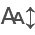

In [80]:
from itables import init_notebook_mode, show
import itables.options as opt
opt.maxBytes = "1MB"
opt.maxColumns = 0
init_notebook_mode(all_interactive=True)

In [81]:
df.loc[df['protocolSection.identificationModule.organization.class'] == 'INDUSTRY'].sort_values(by='protocolSection.statusModule.studyFirstSubmitDate', ascending=False).reset_index(drop=True)

protocolSection.identificationModule.nctId  \
0                                  NCT06655155   
1                                  NCT06655896   
2                                  NCT06647069   
3                                  NCT06643390   
4                                  NCT06619561   
..                                         ...   
124                                NCT00077584   
125                                NCT00070590   
126                                NCT00048776   
127                                NCT00043706   
128                                NCT00025818   

    protocolSection.identificationModule.orgStudyIdInfo.id  \
0                                        ARGX-113-2317       
1                                        CYTB323K12201       
2                                      DR-0201-AIM-001       
3                                             2225-003       
4                                      DCC-3014-02-001       
..                                                 ...       
124                                         AC-052-331       
125                                         AC-052-330       
126                                          21-01-336       
127                                      ATGFB1-001-01       
128                                      192371-011-01       

    protocolSection.identificationModule.organization.fullName  \
0                                               argenx           
1                                             Novartis           
2                                             Dren Bio           
3                              Merck Sharp & Dohme LLC           
4                       Deciphera Pharmaceuticals, LLC           
..                                                 ...           
124                                           Actelion           
125                                           Actelion           
126                      Otsuka America Pharmaceutical           
127                                             Sanofi           
128                                           Allergan           

    protocolSection.identificationModule.organization.class  \
0                                             INDUSTRY        
1                                             INDUSTRY        
2                                             INDUSTRY        
3                                             INDUSTRY        
4                                             INDUSTRY        
..                                                 ...        
124                                           INDUSTRY        
125                                           INDUSTRY        
126                                           INDUSTRY        
127                                           INDUSTRY        
128                                           INDUSTRY        

       protocolSection.identificationModule.briefTitle  \
0    A Study to Assess the Efficacy and Safety of E...   
1    Phase 2 Study Evaluating Rapcabtagene Autoleuc...   
2         DR-0201 in Subjects With Autoimmune Diseases   
3    A Study of MK-2225 in Healthy Participants (MK...   
4    A Study to Evaluate Vimseltinib in Adults with...   
..                                                 ...   
124  Efficacy and Safety of Oral Bosentan on Healin...   
125  Efficacy and Safety of Oral Bosentan in Pulmon...   
126  Safety and Efficacy of Pletal (Cilostazol) for...   
127  Safety, Tolerability, and Pharmacokinetics of ...   
128  Six Month Clinical Research Study for Patients...   

    protocolSection.identificationModule.officialTitle  \
0    A Randomized, Double-Blinded, Placebo-Controll...   
1    A Phase 2, Multi-part, Randomized, Open-label,...   
2    A Phase 1, Open-label, Multiple Ascending Dose...   
3    A Multiple Ascending Dose Clinical Study to Ev...   
4    A Phase 2, Open-label, Multicenter Study to Ev...   
..                                                 ...   
124  

In [82]:
show(
    df,
    layout={"top1": "searchBuilder"},
    searchBuilder={
        "preDefined": {
            # "criteria": [
            #     {"data": "climate_zone", "condition": "=", "value": ["Sub-tropical"]}
            # ]
        }
    },
)

In [24]:
api.print_dict_recursively(study)

protocolSection: 
    identificationModule: 
        nctId: NCT06619561
        orgStudyIdInfo: 
            id: DCC-3014-02-001
        organization: 
            fullName: Deciphera Pharmaceuticals, LLC
            class: INDUSTRY
        briefTitle: A Study to Evaluate Vimseltinib in Adults with Active Chronic Graft-Versus-Host Disease (cGVHD)
        officialTitle: A Phase 2, Open-label, Multicenter Study to Evaluate the Safety, Tolerability, PK, and Efficacy of Vimseltinib in Adults with Active Chronic GVHD After Failure of Prior Systemic Therapy
    statusModule: 
        statusVerifiedDate: 2024-11
        overallStatus: RECRUITING
        expandedAccessInfo: 
            hasExpandedAccess: False
        startDateStruct: 
            date: 2024-12
            type: ESTIMATED
        primaryCompletionDateStruct: 
            date: 2029-10
            type: ESTIMATED
        completionDateStruct: 
            date: 2029-10
            type: ESTIMATED
        studyFirstSubmitDate: 

In [1]:
from orange_book import OrangeBook
ob = OrangeBook()

In [11]:
novartis_df = ob.df.loc[ob.df.Applicant.str.contains('NOVARTIS')].reset_index(drop=True)

In [17]:
novartis_df.sort_values(by='Appl_No', ascending=False).head()

,Ingredient,DF;Route,Trade_Name,Applicant,Strength,Appl_Type,Appl_No,Product_No,TE_Code,Approval_Date,...,Applicant_Full_Name,Patent_No,Patent_Expire_Date_Text,Drug_Substance_Flag,Drug_Product_Flag,Patent_Use_Code,Delist_Flag,Submission_Date,Exclusivity_Code,Exclusivity_Date
2,SACUBITRIL; VALSARTAN,"CAPSULE, PELLETS;ORAL",ENTRESTO SPRINKLE,NOVARTIS,6MG;6MG,N,218591,1,,"Apr 12, 2024",...,NOVARTIS PHARMACEUTICALS CORP,9388134,"Nov 8, 2026",,,U-1723,,"May 8, 2024",,
3,SACUBITRIL; VALSARTAN,"CAPSULE, PELLETS;ORAL",ENTRESTO SPRINKLE,NOVARTIS,6MG;6MG,N,218591,1,,"Apr 12, 2024",...,NOVARTIS PHARMACEUTICALS CORP,8101659,"Jan 15, 2025",,Y,,,"May 8, 2024",,
4,SACUBITRIL; VALSARTAN,"CAPSULE, PELLETS;ORAL",ENTRESTO SPRINKLE,NOVARTIS,6MG;6MG,N,218591,1,,"Apr 12, 2024",...,NOVARTIS PHARMACEUTICALS CORP,8877938,"May 27, 2027",Y,Y,,,"May 8, 2024",,
5,SACUBITRIL; VALSARTAN,"CAPSULE, PELLETS;ORAL",ENTRESTO SPRINKLE,NOVARTIS,15MG;16MG,N,218591,2,,"Apr 12, 2024",...,NOVARTIS PHARMACEUTICALS CORP,10722471,"Feb 2, 2037",,Y,U-3896,,"May 8, 2024",,
6,SACUBITRIL; VALSARTAN,"CAPSULE, PELLETS;ORAL",ENTRESTO SPRINKLE,NOVARTIS,15MG;16MG,N,218591,2,,"Apr 12, 2024",...,NOVARTIS PHARMACEUTICALS CORP,9388134,"Nov 8, 2026",,,U-1723,,"May 8, 2024",,


In [18]:
from rxnav import RxApi

In [19]:
# Example usage
api = RxApi()
# Get RxNorm ID for Atorvastatin
drug_name = "Atorvastatin"
rxcui = api.get_rxnorm_id(drug_name)
print(f"RxNorm ID for {drug_name}: {rxcui}")

# Get mechanism of action for the RxNorm ID
if rxcui:
    moa = api.get_moa(rxcui)
    print(f"Mechanism of Action for {drug_name}: {moa}")

if rxcui:
    classes =  api.get_class_by_rxcui(rxcui, 'all')

RxNorm ID for Atorvastatin: 83367
Mechanism of Action for Atorvastatin: ['Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'Hydroxymethylglutaryl-CoA Reductase Inhibitors']


In [20]:
for cls in classes:
    if cls.get('rxclassMinConceptItem'):
        print(cls.get('rxclassMinConceptItem'))
        if cls.get('rxclassMinConceptItem').get('classType') == 'MOA':
            class_id = cls.get('rxclassMinConceptItem').get('classId')
            break

{'classId': 'D000069059', 'className': 'Atorvastatin', 'classType': 'CHEM'}
{'classId': 'D003324', 'className': 'Coronary Artery Disease', 'classType': 'DISEASE'}
{'classId': 'D003324', 'className': 'Coronary Artery Disease', 'classType': 'DISEASE'}
{'classId': 'D004342', 'className': 'Drug Hypersensitivity', 'classType': 'DISEASE'}
{'classId': 'D006937', 'className': 'Hypercholesterolemia', 'classType': 'DISEASE'}
{'classId': 'D006951', 'className': 'Hyperlipoproteinemias', 'classType': 'DISEASE'}
{'classId': 'D007774', 'className': 'Lactation', 'classType': 'DISEASE'}
{'classId': 'D008107', 'className': 'Liver Diseases', 'classType': 'DISEASE'}
{'classId': 'D011247', 'className': 'Pregnancy', 'classType': 'DISEASE'}
{'classId': 'D015228', 'className': 'Hypertriglyceridemia', 'classType': 'DISEASE'}
{'classId': 'D017093', 'className': 'Liver Failure', 'classType': 'DISEASE'}
{'classId': 'N0000000121', 'className': 'Hydroxymethylglutaryl-CoA Reductase Inhibitors', 'classType': 'MOA'}


In [22]:
contexts = api.get_class_contexts(class_id)
contexts

{'classPathList': {'classPath': [{'rxclassMinConcept': [{'classId': 'N0000000121',
      'className': 'Hydroxymethylglutaryl-CoA Reductase Inhibitors',
      'classType': 'MOA'},
     {'classId': 'N0000175919',
      'className': 'Cholesterol Synthesis Inhibitors',
      'classType': 'MOA'},
     {'classId': 'N0000009956',
      'className': 'Sterol Synthesis Inhibitors',
      'classType': 'MOA'},
     {'classId': 'N0000000133',
      'className': 'Enzyme Inhibitors',
      'classType': 'MOA'},
     {'classId': 'N0000000163',
      'className': 'Enzyme Interactions',
      'classType': 'MOA'},
     {'classId': 'N0000000223',
      'className': 'Mechanism of Action',
      'classType': 'MOA'}]}]}}